<a href="https://colab.research.google.com/github/tajulo2020/master/blob/main/likelihood_%26_severity_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing / Installing packages

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.mlab as mlab
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from matplotlib import pyplot as plt
# Increases the size of sns plots
sns.set(rc={'figure.figsize':(12,10)})

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Full Display of outputs 

In [ ]:
pd.options.display.max_columns= None

In [ ]:
pd.options.display.max_rows= None

Loading the Raw Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# reading the Final data  file
rootdir="/content/drive/MyDrive"#update your root directory
df=pd.read_csv(rootdir+"/finalstuff.csv")

## Exploritory Data Analysis

In [ ]:
# getting the structure of the final data set.
df.info()
df.describe().transpose()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 348 entries, 0 to 347
Data columns (total 49 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gvkey             348 non-null    int64  
 1   ggroup            348 non-null    float64
 2   tic               348 non-null    object 
 3   gsector           348 non-null    float64
 4   gind              348 non-null    float64
 5   gsubind           348 non-null    float64
 6   state             348 non-null    object 
 7   sic               348 non-null    int64  
 8   dvpsx_f           348 non-null    float64
 9   seq               348 non-null    float64
 10  teq               348 non-null    float64
 11  txt               348 non-null    float64
 12  wcap              348 non-null    float64
 13  xsga              348 non-null    float64
 14  cshtr_c           348 non-null    float64
 15  dvpsp_c           348 non-null    float64
 16  dvpsx_c           348 non-null    float64
 1

(348, 49)

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
gvkey,348.0,8.301817e+04,7.679486e+04,1.239000e+03,1.210725e+04,6.131100e+04,1.656938e+05,2.774870e+05
ggroup,348.0,3.021264e+03,6.406876e+00,3.010000e+03,3.020000e+03,3.020000e+03,3.030000e+03,3.030000e+03
gsector,348.0,3.000000e+01,0.000000e+00,3.000000e+01,3.000000e+01,3.000000e+01,3.000000e+01,3.000000e+01
gind,348.0,3.021434e+05,6.428338e+02,3.010100e+05,3.020100e+05,3.020200e+05,3.030100e+05,3.030200e+05
gsubind,348.0,3.021436e+07,6.427736e+04,3.010101e+07,3.020103e+07,3.020203e+07,3.030101e+07,3.030201e+07
sic,348.0,2.836960e+03,1.571255e+03,1.000000e+02,2.040000e+03,2.092000e+03,2.844000e+03,9.997000e+03
dvpsx_f,348.0,2.482050e-16,1.001440e+00,-5.391443e-01,-5.391443e-01,-4.927039e-01,1.387357e-01,6.352012e+00
seq,348.0,2.169401e-17,1.001440e+00,-6.293960e-01,-3.005202e-01,-2.740127e-01,-1.785645e-01,1.045997e+01
teq,348.0,2.504382e-17,1.001440e+00,-6.182291e-01,-3.003403e-01,-2.723127e-01,-1.800572e-01,1.066796e+01
txt,348.0,8.980683e-17,1.001440e+00,-3.822854e-01,-2.834352e-01,-2.712287e-01,-1.917354e-01,1.343595e+01


In [ ]:
#checking for missing values 
df.isnull().sum()

gvkey                 0
ggroup                0
tic                   0
gsector               0
gind                  0
gsubind               0
state                 0
sic                   0
dvpsx_f               0
seq                   0
teq                   0
txt                   0
wcap                  0
xsga                  0
cshtr_c               0
dvpsp_c               0
dvpsx_c               0
prch_c                0
dvpsp_f               0
mkvalt                0
prcc_f                0
prch_f                0
prcl_f                0
sale                  0
reuna                 0
ppent                 0
pi                    0
at                    0
capx                  0
cogs                  0
cshfd                 0
cshpri                0
dltt                  0
epsfi                 0
epsfx                 0
epspi                 0
epspx                 0
ibmii                 0
mii                   0
ni                    0
nopi                  0
stko            

In [ ]:
# Investigate all the elements whithin each Feature 

for column in df:
    unique_values = pd.unique(df[column])
    nr_values = len(unique_values)
    if nr_values <= 10:
        print("The number of values for feature {} is: {} -- {}".format(column, nr_values, unique_values))
    else:
        print("The number of values for feature {} is: {}".format(column, nr_values))

The number of values for feature gvkey is: 348
The number of values for feature ggroup is: 3 -- [3030. 3020. 3010.]
The number of values for feature tic is: 348
The number of values for feature gsector is: 1 -- [30.]
The number of values for feature gind is: 6 -- [303020. 302020. 302010. 301010. 302030. 303010.]
The number of values for feature gsubind is: 12
The number of values for feature state is: 45
The number of values for feature sic is: 61
The number of values for feature dvpsx_f is: 130
The number of values for feature seq is: 348
The number of values for feature teq is: 347
The number of values for feature txt is: 276
The number of values for feature wcap is: 348
The number of values for feature xsga is: 346
The number of values for feature cshtr_c is: 327
The number of values for feature dvpsp_c is: 128
The number of values for feature dvpsx_c is: 128
The number of values for feature prch_c is: 332
The number of values for feature dvpsp_f is: 130
The number of values for fea

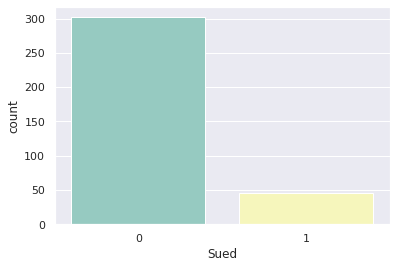

In [ ]:
# Investigating the distr of y
sns.countplot(x = 'Sued', data = df, palette = 'Set3')

In [ ]:
df.columns

Index(['gvkey', 'ggroup', 'tic', 'gsector', 'gind', 'gsubind', 'state', 'sic',
       'dvpsx_f', 'seq', 'teq', 'txt', 'wcap', 'xsga', 'cshtr_c', 'dvpsp_c',
       'dvpsx_c', 'prch_c', 'dvpsp_f', 'mkvalt', 'prcc_f', 'prch_f', 'prcl_f',
       'sale', 'reuna', 'ppent', 'pi', 'at', 'capx', 'cogs', 'cshfd', 'cshpri',
       'dltt', 'epsfi', 'epsfx', 'epspi', 'epspx', 'ibmii', 'mii', 'ni',
       'nopi', 'stko', 'trfm', 'trt1m', 'prcc_diff', 'cshoc', 'splticrm',
       'Sued', 'SettlementAmount'],
      dtype='object')

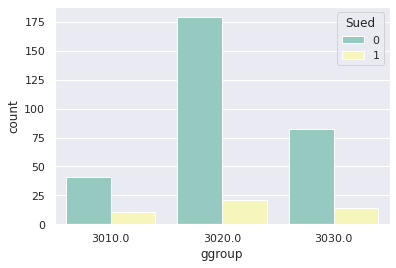

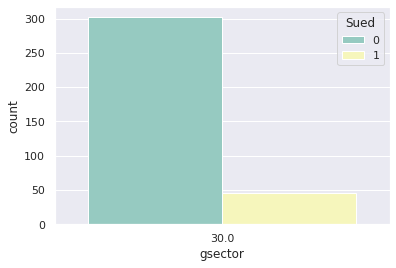

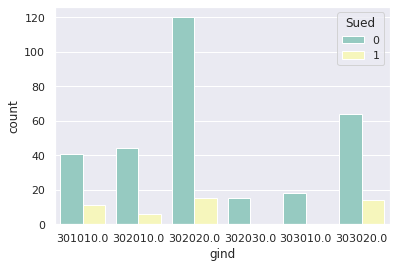

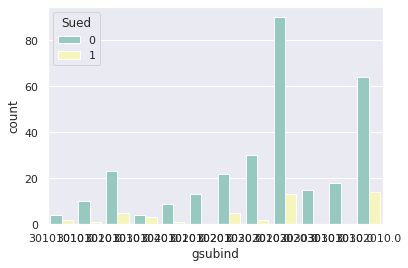

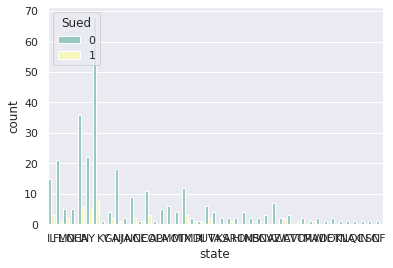

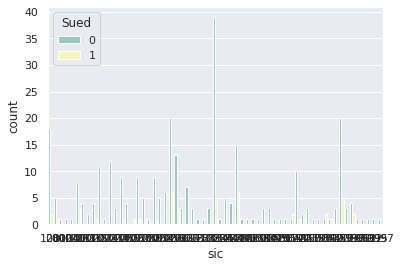

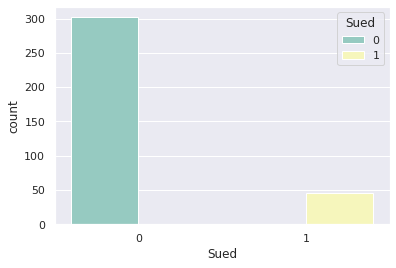

In [ ]:
# Looping through all the features by our y variable - see if there is relationship

features = [ 'ggroup', 'gsector', 'gind', 'gsubind', 'state', 'sic','Sued',]

for f in features:
    sns.countplot(x = f, data = df, palette = 'Set3', hue = 'Sued')
    plt.show()

In [ ]:
!pip install autoviz

     |████████████████████████████████| 62 kB 436 kB/s 
     |████████████████████████████████| 3.1 MB 9.0 MB/s 
     |████████████████████████████████| 175 kB 69.1 MB/s 
     |████████████████████████████████| 136 kB 63.3 MB/s 
     |████████████████████████████████| 18.5 MB 22.1 MB/s 
     |████████████████████████████████| 11.2 MB 23.8 MB/s 
     |████████████████████████████████| 1.7 MB 74.3 MB/s 
     |████████████████████████████████| 12.9 MB 25.8 MB/s 
     |████████████████████████████████| 930 kB 27.4 MB/s 
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171046 sha256=c3a4c207dbac4a38837a9c5bab4eaf4bc42682b04db87322afae10613b67af96
  Stored in directory: /root/.cache/pip/wheels/8a/4e/b6/57b01db010d17ef6ea9b40300af725ef3e210cb1acfb7ac8b6
Successfully built emoji
  Attempting uninstall: bokeh
    Found existing installation: bokeh 2.3.3
    Uninstalling bokeh-2.3.3:
      Successfully uninstalled bokeh-2.3.3
  Attempting uninstall: panel
    Found existing 

Alert! from version 0.1.39, fter importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
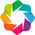

In [ ]:
import autoviz
from autoviz.AutoViz_Class import AutoViz_Class

In [ ]:
av=AutoViz_Class()

Shape of your Data Set loaded: (348, 52)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    51 Predictors classified...
        3 variables removed since they were ID or low-information variables

################ Binary_Classification problem #####################
Number of variables = 48 exceeds limit, finding top 30 variables through XGBoost
    No categorical feature reduction done. All 2 Categorical vars selected 
    Removing correlated variables from 46 numerics using SULO method
    Adding 2 categorical variables to reduced numeric variables  of 12
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 14 
    Finding Important Features using Boosted Trees algorithm...
        using

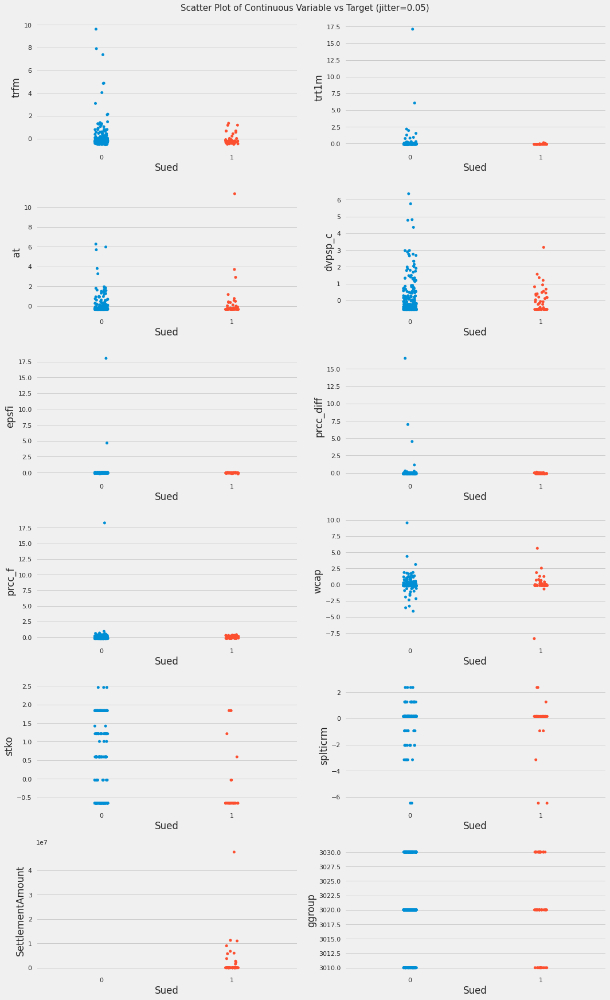

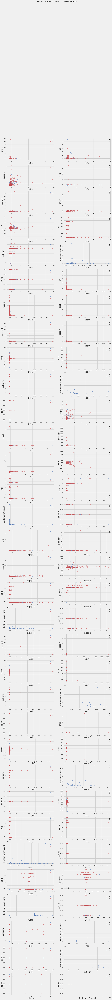

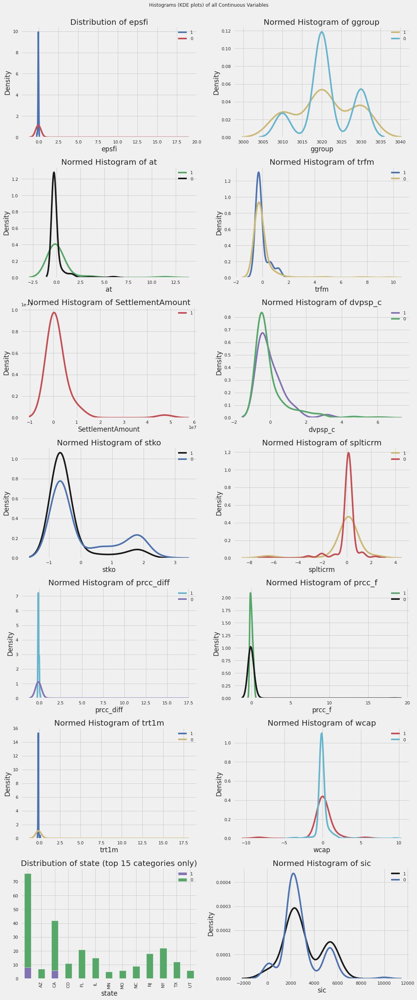

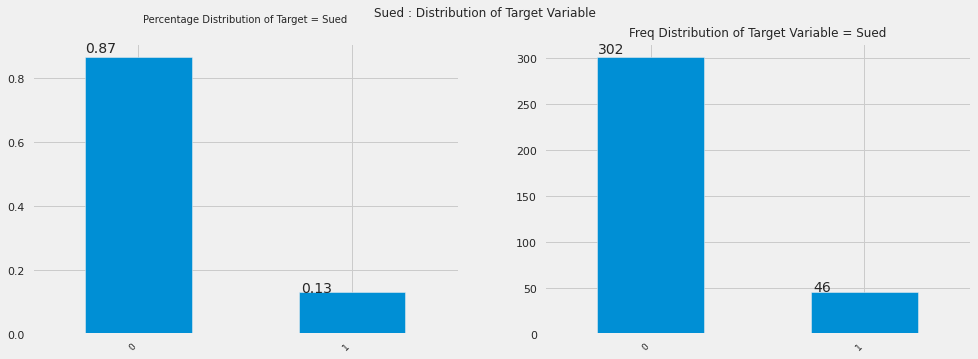

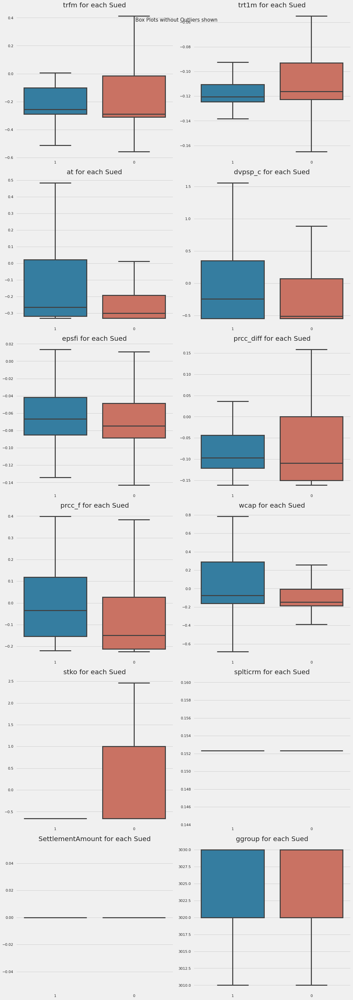

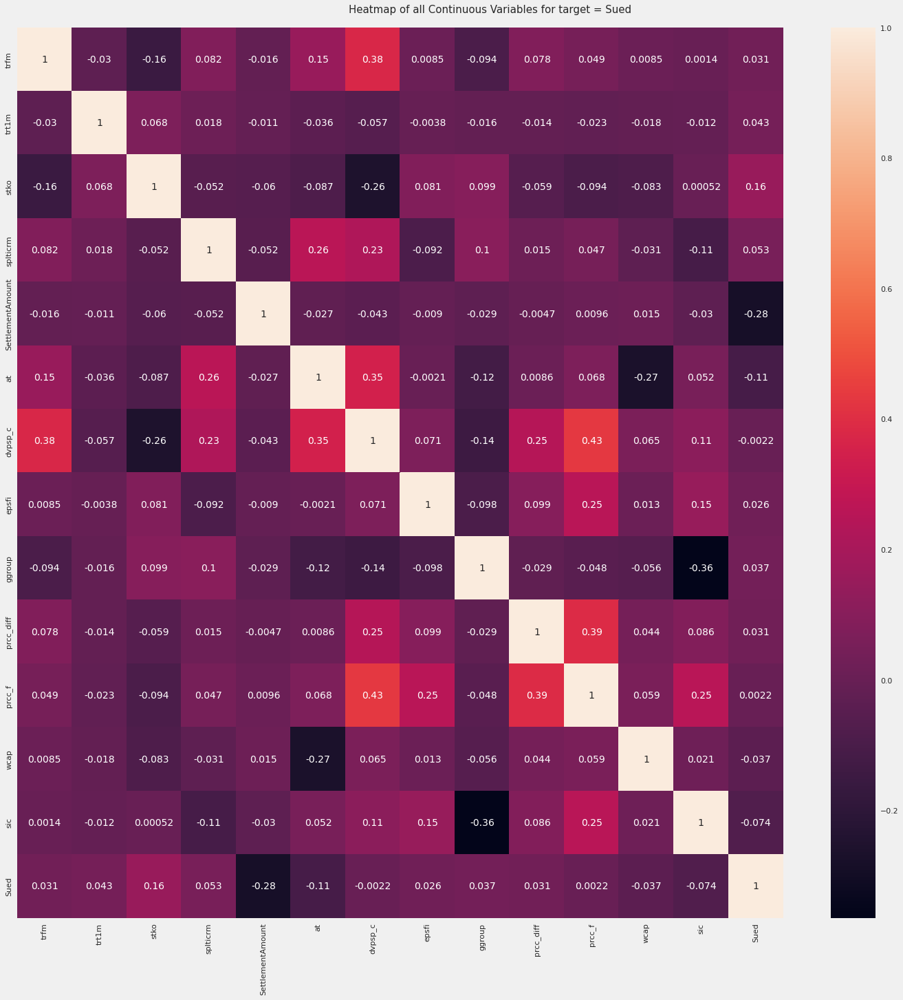

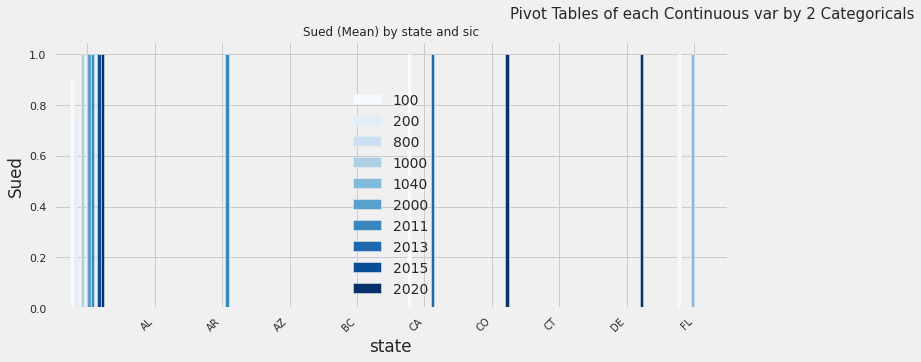

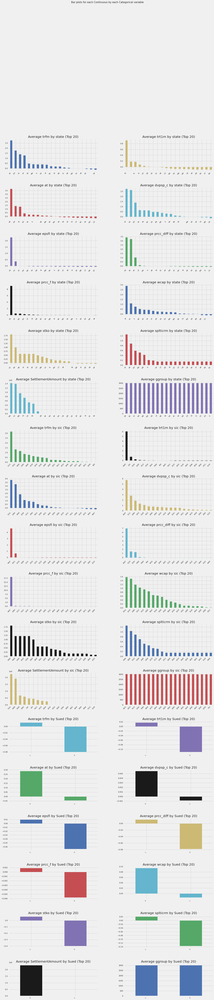

In [ ]:
autoviz_eda=av.AutoViz('/content/drive/MyDrive/finalfinal1.csv', depVar="Sued",sep = ",",lowess=False,chart_format="svg",max_rows_analyzed=150000,max_cols_analyzed=30,)


 ## Feature Selection- With Correlation

**Steps of Running Feature Importance**


*   Split the data into X & y 
*   Run a Tree-based estimators (i.e. decision trees & random forests)
*   Run Feature Importance







In [ ]:
dt=df.copy()

In [ ]:
dt.head()

,gvkey,ggroup,tic,gsector,gind,gsubind,state,sic,dvpsx_f,seq,...,ni,nopi,stko,trfm,trt1m,prcc_diff,cshoc,splticrm,Sued,SettlementAmount
0,1239,3030.0,ACV,30.0,303020.0,30302010.0,IL,2844,-0.440271,-0.262800,...,-0.258987,-0.222099,-0.656926,6.531721e-03,-1.245310e-01,-1.253795e-01,-2.027304e-01,0.152314,1,0.0
1,1266,3020.0,ALCO,30.0,302020.0,30202010.0,FL,100,-0.287467,-0.287721,...,-0.273740,-0.187650,-0.656926,-5.160469e-02,-1.210713e-01,-6.457931e-02,-2.921853e-01,0.152314,0,NaN
2,1408,3020.0,BEAM,30.0,302010.0,30201020.0,IL,2085,0.431610,0.274403,...,0.006029,-0.174890,-0.656926,4.865876e+00,-1.137185e-01,1.142007e+00,-2.073847e-01,0.152314,0,NaN
3,1429,3020.0,2388B,30.0,302020.0,30202030.0,MN,2060,-0.539144,-0.264322,...,-0.257237,-0.221763,1.837005,4.666851e-16,8.134663e-17,-2.370852e-17,-5.789052e-17,0.152314,0,NaN
4,1659,3010.0,ANDE,30.0,301010.0,30101020.0,OH,5150,0.096041,-0.234826,...,-0.235814,-0.011031,-0.656926,-2.081437e-01,-1.089518e-01,-1.978624e-02,-2.804795e-01,0.152314,0,NaN


In [ ]:
dt.columns

Index(['gvkey', 'ggroup', 'tic', 'gsector', 'gind', 'gsubind', 'state', 'sic',
       'dvpsx_f', 'seq', 'teq', 'txt', 'wcap', 'xsga', 'cshtr_c', 'dvpsp_c',
       'dvpsx_c', 'prch_c', 'dvpsp_f', 'mkvalt', 'prcc_f', 'prch_f', 'prcl_f',
       'sale', 'reuna', 'ppent', 'pi', 'at', 'capx', 'cogs', 'cshfd', 'cshpri',
       'dltt', 'epsfi', 'epsfx', 'epspi', 'epspx', 'ibmii', 'mii', 'ni',
       'nopi', 'stko', 'trfm', 'trt1m', 'prcc_diff', 'cshoc', 'splticrm',
       'Sued', 'SettlementAmount'],
      dtype='object')

In [ ]:
X = dt.drop(["gvkey","Sued","tic","state","SettlementAmount"],axis=1)   #Feature Matrix
y = dt["Sued"] 

In [ ]:
X.head()

,ggroup,gsector,gind,gsubind,sic,dvpsx_f,seq,teq,txt,wcap,...,ibmii,mii,ni,nopi,stko,trfm,trt1m,prcc_diff,cshoc,splticrm
0,3030.0,30.0,303020.0,30302010.0,2844,-0.440271,-0.262800,-0.263883,-0.261244,-0.083417,...,-0.266195,-0.172712,-0.258987,-0.222099,-0.656926,6.531721e-03,-1.245310e-01,-1.253795e-01,-2.027304e-01,0.152314
1,3020.0,30.0,302020.0,30202010.0,100,-0.287467,-0.287721,-0.287972,-0.273806,-0.160988,...,-0.281732,-0.172712,-0.273740,-0.187650,-0.656926,-5.160469e-02,-1.210713e-01,-6.457931e-02,-2.921853e-01,0.152314
2,3020.0,30.0,302010.0,30201020.0,2085,0.431610,0.274403,0.255853,-0.161896,1.350208,...,-0.092201,-0.156421,0.006029,-0.174890,-0.656926,4.865876e+00,-1.137185e-01,1.142007e+00,-2.073847e-01,0.152314
3,3020.0,30.0,302020.0,30202030.0,2060,-0.539144,-0.264322,-0.260381,-0.278600,-0.140303,...,-0.260834,-0.124537,-0.257237,-0.221763,1.837005,4.666851e-16,8.134663e-17,-2.370852e-17,-5.789052e-17,0.152314
4,3010.0,30.0,301010.0,30101020.0,5150,0.096041,-0.234826,-0.234897,-0.216639,0.041098,...,-0.241200,-0.165362,-0.235814,-0.011031,-0.656926,-2.081437e-01,-1.089518e-01,-1.978624e-02,-2.804795e-01,0.152314


In [ ]:
 #separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.5,
    random_state=0)

X_train.shape, X_test.shape

((174, 44), (174, 44))

Feature Importance 

In [ ]:
from sklearn.ensemble import RandomForestClassifier

Ftimp = RandomForestClassifier(random_state=0,criterion ='entropy', max_depth = 10)
Ftimp.fit(X,y)
 

RandomForestClassifier(criterion='entropy', max_depth=10, random_state=0)

In [ ]:
!pip install eli5

     |████████████████████████████████| 106 kB 4.3 MB/s 


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(Ftimp, random_state=0).fit(X_train, y_train)
eli5.show_weights(perm, feature_names = X_train.columns.tolist())

Weight,Feature
0.0414 ± 0.0134,cshtr_c
0.0195 ± 0.0056,reuna
0.0172 ± 0.0206,wcap
0.0161 ± 0.0046,pi
0.0138 ± 0.0156,xsga
0.0115 ± 0.0073,seq
0.0115 ± 0.0145,ppent
0.0115 ± 0.0103,prcc_diff
0.0103 ± 0.0046,trt1m
0.0103 ± 0.0046,prch_f


correlation 

In [ ]:
X_a = dt[['cshtr_c' , 'reuna' , 'wcap' , 'pi' , 'xsga' , 'seq' , 'ppent' , 'prcc_diff' , 'trt1m' , 'prch_f' , 'mkvalt' , 'txt' , 'cshfd' , 'nopi' , 'dvpsp_f' , 'prcl_f' , 'dltt' , 'cshoc' , 'prch_c']]

In [ ]:
#create a new split with top 10 feature 
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(
    X_a,
    y,
    test_size=0.5,
    random_state=0)

X_train.shape, X_test.shape  

((174, 44), (174, 44))

In [ ]:
X_a.corr()

,cshtr_c,reuna,wcap,pi,xsga,seq,ppent,prcc_diff,trt1m,prch_f,mkvalt,txt,cshfd,nopi,dvpsp_f,prcl_f,dltt,cshoc,prch_c
cshtr_c,1.000000,0.684723,0.011181,0.620752,0.610801,0.578430,0.556392,0.020818,-0.041435,0.032171,0.732574,0.643541,0.649643,0.433954,0.287331,0.039023,0.665716,0.297188,0.031694
reuna,0.684723,1.000000,-0.241767,0.877274,0.799210,0.820261,0.758255,0.034163,-0.029128,0.064698,0.932270,0.872501,0.673557,0.651043,0.312947,0.078801,0.806941,0.347504,0.064754
wcap,0.011181,-0.241767,1.000000,-0.284909,-0.350375,-0.200830,-0.380677,0.043979,-0.018387,0.058912,-0.230435,-0.276065,-0.141256,-0.196154,0.060207,0.056764,-0.310225,-0.009656,0.059226
pi,0.620752,0.877274,-0.284909,1.000000,0.876032,0.899527,0.836435,0.009819,-0.031163,0.066533,0.855720,0.980743,0.774748,0.811385,0.386825,0.081794,0.883300,0.388661,0.066601
xsga,0.610801,0.799210,-0.350375,0.876032,1.000000,0.857656,0.964435,-0.001213,-0.027392,0.042238,0.793466,0.910961,0.655645,0.709670,0.243092,0.053321,0.793708,0.321888,0.042466
seq,0.578430,0.820261,-0.200830,0.899527,0.857656,1.000000,0.801277,0.001397,-0.032700,0.062854,0.740013,0.870235,0.748182,0.709224,0.297799,0.075168,0.812479,0.381897,0.062916
ppent,0.556392,0.758255,-0.380677,0.836435,0.964435,0.801277,1.000000,-0.000237,-0.023901,0.043230,0.770343,0.879786,0.581198,0.740663,0.222377,0.053670,0.797889,0.312919,0.043241
prcc_diff,0.020818,0.034163,0.043979,0.009819,-0.001213,0.001397,-0.000237,1.000000,-0.013881,0.390078,0.023067,0.004316,-0.006986,-0.008102,0.242270,0.392168,0.019709,-0.018369,0.388204
trt1m,-0.041435,-0.029128,-0.018387,-0.031163,-0.027392,-0.032700,-0.023901,-0.013881,1.000000,-0.022907,-0.030479,-0.030930,-0.030463,-0.023150,-0.056373,-0.022661,-0.036316,-0.020603,-0.023108
prch_f,0.032171,0.064698,0.058912,0.066533,0.042238,0.062854,0.043230,0.390078,-0.022907,1.000000,0.058404,0.062631,0.025122,0.060478,0.426168,0.998905,0.057316,0.014032,0.999897


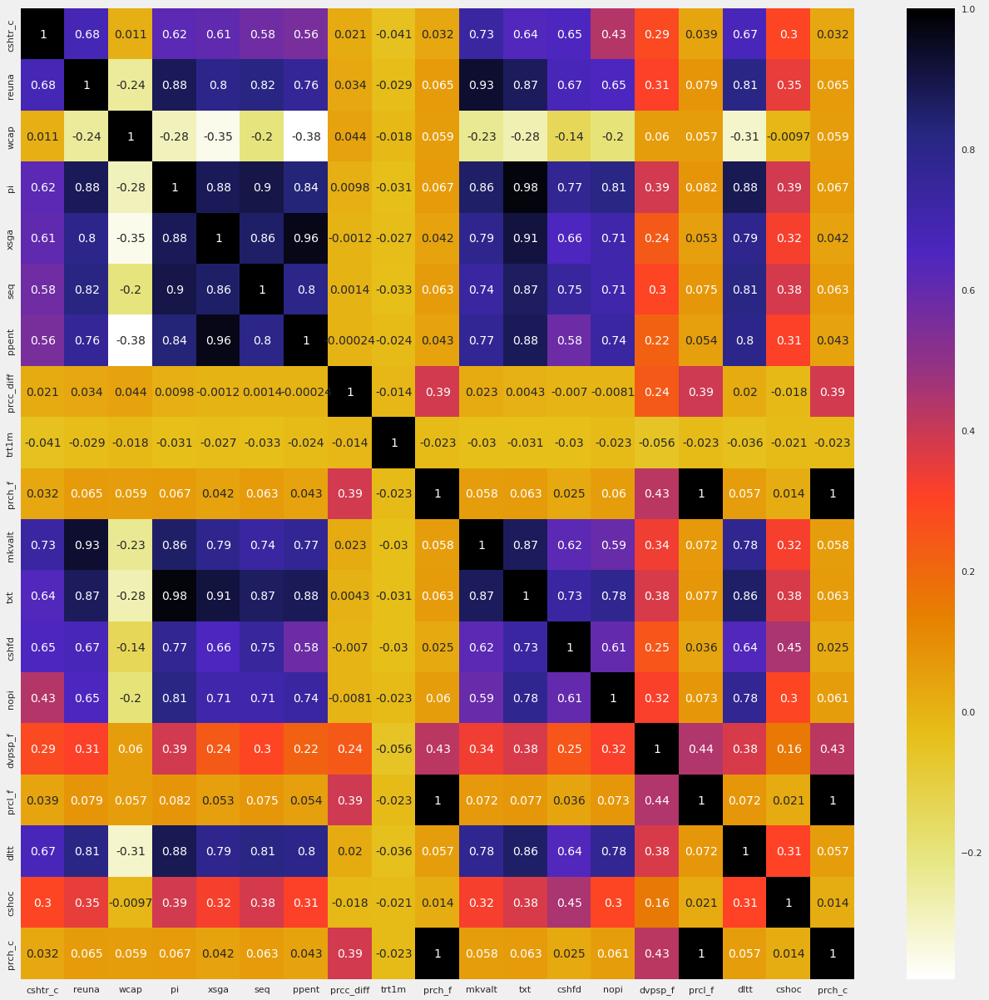

In [ ]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(20,20))
cor = X_a.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [ ]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [ ]:
corr_features = correlation(X_a, 0.8)
len(set(corr_features))

10

In [ ]:
corr_features

{'dltt',
 'mkvalt',
 'nopi',
 'pi',
 'ppent',
 'prch_c',
 'prcl_f',
 'seq',
 'txt',
 'xsga'}

Feature selection 


##Evaluate model parameters using statsmodels

In [ ]:
# module imports
from patsy import dmatrices
import numpy as np
import statsmodels.api as sm
from statsmodels.tools import add_constant as add_constant

In [ ]:
#fit regression model
model = sm.OLS(y, X_a).fit()

#view summary of model fit
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:                   Sued   R-squared (uncentered):                   0.278
Model:                            OLS   Adj. R-squared (uncentered):              0.239
Method:                 Least Squares   F-statistic:                              7.074
Date:                Fri, 06 May 2022   Prob (F-statistic):                    2.88e-15
Time:                        12:36:53   Log-Likelihood:                         -84.914
No. Observations:                 348   AIC:                                      205.8
Df Residuals:                     330   BIC:                                      275.2
Df Model:                          18                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

## Logistic Regression final take.


In [ ]:
# module imports
from patsy import dmatrices
import numpy as np
import statsmodels.api as sm
from statsmodels.tools import add_constant as add_constant

In [ ]:
y2, X2 = dmatrices('Sued ~ + prcl_f  + prch_f  + mkvalt  + cshoc ', dt, return_type = 'dataframe')

In [ ]:
#add constant to predictor variables
X2 = sm.add_constant(X2)

In [ ]:
#fit regression model
model = sm.OLS(y2, X2).fit()

#view summary of model fit
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   Sued   R-squared:                       0.124
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     12.13
Date:                Fri, 06 May 2022   Prob (F-statistic):           3.13e-09
Time:                        12:46:11   Log-Likelihood:                -94.006
No. Observations:                 348   AIC:                             198.0
Df Residuals:                     343   BIC:                             217.3
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1322      0.017      7.722      0.0

The p-values for all of the variables are very small, below the 0.05 threshold as such there are are significant to the model.

saving the final model      


In [ ]:
#import pickle
# save the model to disk
#rootdir="/content/drive/MyDrive
#filename = '/content/drive/MyDrive/finalized_model.sav'
#pickle.dump(model, open(filename, 'wb'))

In [ ]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.predict(X_test, Y_test)


### Logistic Regression Model Fitting

In [ ]:
# Creating new Independent feature based of significance on the OLS Regression Results 
X_last = dt[["prcl_f","prch_f","mkvalt","cshoc"]]

In [ ]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X_last,
    y,
    test_size=0.5,
    random_state=0)

X_train.shape, X_test.shape

((174, 4), (174, 4))

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logreg = LogisticRegression(random_state=0, solver = 'lbfgs')
logreg.fit(X_train, y_train)

LogisticRegression(random_state=0)

###Predicting the test set results and caculating the accuracy

In [ ]:
# predict - Predict class labels for samples in X
logreg.predict(X_train)
ypred = logreg.predict(X_train)

# predict_proba - Probability estimates
pred_proba = logreg.predict_proba(X_train)

# coef_ - Coefficient of the features in the decision function
logreg.coef_

# score- Returns the mean accuracy on the given test data and labels - below

array([[-0.59327568,  0.56706114,  0.18318048,  0.26213578]])

In [ ]:
y_pred = logreg.predict(X_test)
print (y_pred)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]


In [ ]:
y_pred1 = logreg.predict_proba(X_test)[:,1]
print (y_pred1)

[0.13044419 0.29461171 0.13257386 0.13293017 0.14178739 0.13336665
 0.1326873  0.26426113 0.14952503 0.13571163 0.14352423 0.13224107
 0.13484387 0.1329881  0.14352873 0.13334631 0.13212894 0.15143863
 0.13323068 0.13421744 0.24064128 0.13503704 0.16799664 0.1321755
 0.13202269 0.1377892  0.13599486 0.13421149 0.1326612  0.16415671
 0.14275526 0.13234834 0.56425218 0.13231106 0.17708353 0.13452341
 0.14675249 0.13604495 0.1313442  0.55295471 0.13391916 0.13332369
 0.13979264 0.13347026 0.13338764 0.14006883 0.135897   0.14616859
 0.13410997 0.13634781 0.13387336 0.14682028 0.1425948  0.15510356
 0.16668373 0.15490764 0.13289099 0.14042078 0.13555014 0.1606352
 0.13338971 0.13633518 0.16497957 0.14277863 0.13544762 0.14038507
 0.1364821  0.13614786 0.13431248 0.14074903 0.13393485 0.13332513
 0.15228538 0.19483677 0.13476481 0.13541501 0.1314977  0.14861582
 0.13666855 0.13279196 0.13319904 0.14343037 0.14323646 0.15763609
 0.13246088 0.14865151 0.13321112 0.1355847  0.13202235 0.223741

In [ ]:
#Predicting file for submission
final_prob = pd.Series(logreg.predict_proba(X_test)[:,1], name="probalility_of_event")

ID_Column = dt["gvkey"]
ID_Column_company = dt[dt.gvkey== 9777]
submission1 = pd.concat([ID_Column,final_prob], axis=1)

In [ ]:
submission1.head()

,gvkey,probalility_of_event
0,1239,0.130444
1,1266,0.294612
2,1408,0.132574
3,1429,0.132930
4,1659,0.141787


In [ ]:
# Applying the SJM to the prediction 
sub2 =submission1[submission1.gvkey ==9777]

In [ ]:
print(sub2)

    gvkey  probalility_of_event
63   9777              0.142779


In [ ]:
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.89


In [ ]:
#print the regression coefficients

print("The intercept b0= ", logreg.intercept_)

print("The coefficient b1= ", logreg.coef_)

The intercept b0=  [-1.75170907]
The coefficient b1=  [[-0.59327568  0.56706114  0.18318048  0.26213578]]


###Cross Validation

In [ ]:
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
kfold = model_selection.KFold(n_splits=10)
modelCV = LogisticRegression()
scoring = 'accuracy'
results = model_selection.cross_val_score(modelCV, X_train, y_train, cv=kfold, scoring=scoring)
print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

10-fold cross validation average accuracy: 0.846


###Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[153   1]
 [ 18   2]]


The result is telling us that we have 150+18 correct predictions and 4+2 incorrect predictions.

In [ ]:
#def plot_confusion_matrix(confusion_matrix, classes=None, title='Confusion matrix'):
   # """Plots a confusion matrix."""
    #if classes is not None:
      #  sns.heatmap(confusion_matrix, confusion_matrixap="YlGnBu", xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True, annot_kws={'size':50})
   # else:
        #sns.heatmap(confusion_matrix, vmin=0., vmax=1.)
   # plt.title(title)
   # plt.ylabel('True label')
   # plt.xlabel('Predicted label')

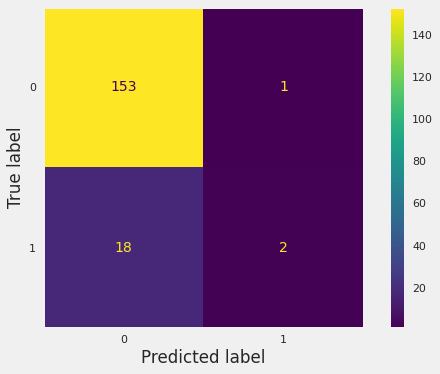

In [ ]:
# Visualizing confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix,display_labels=logreg.classes_)
disp.plot()
plt.tick_params(axis=u'both', which=u'both',length=0)
plt.grid(b=None)
plt.show()

In [ ]:
# Getting the predicted values on the train set and showing first 10 predictions in terms of probabilities
y_train_pred = logreg.predict(X_test)
y_train_pred[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

###Evaluating the Model

In [ ]:
# Accuracy on Train
print("The Training Accuracy is: ", logreg.score(X_train, y_train))

# Accuracy on Test
print("The Testing Accuracy is: ", logreg.score(X_test, y_test))

# Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

The Training Accuracy is:  0.8563218390804598
The Testing Accuracy is:  0.8908045977011494
              precision    recall  f1-score   support

           0       0.89      0.99      0.94       154
           1       0.67      0.10      0.17        20

    accuracy                           0.89       174
   macro avg       0.78      0.55      0.56       174
weighted avg       0.87      0.89      0.85       174



Interpretation:
Of the entire test set, 88% of the promoted term deposit were the term deposit that the customers liked. Of the entire test set, 90% of the customer's preferred term deposit were promoted.

In [ ]:
confusion_matrix/confusion_matrix.sum(axis=1)

array([[0.99350649, 0.05      ],
       [0.11688312, 0.1       ]])

In [ ]:
confusion_matrix

array([[153,   1],
       [ 18,   2]])

In [ ]:
confusion_matrix.sum(axis=0)

array([171,   3])

In [ ]:
np.diag(confusion_matrix)

array([153,   2])

In [ ]:
# Calculating False Positives (FP), False Negatives (FN), True Positives (TP) & True Negatives (TN)

FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)
FN = confusion_matrix.sum(axis=1) - np.diag(confusion_matrix)
TP = np.diag(confusion_matrix)
TN = confusion_matrix.sum() - (FP + FN + TP)


# Sensitivity, hit rate, recall, or true positive rate
TPR = TP / (TP + FN)
print("The True Positive Rate is:", TPR)

# Precision or positive predictive value
PPV = TP / (TP + FP)
print("The Precision is:", PPV)

# False positive rate or False alarm rate
FPR = FP / (FP + TN)
print("The False positive rate is:", FPR)


# False negative rate or Miss Rate
FNR = FN / (FN + TP)
print("The False Negative Rate is: ", FNR)



##Total averages :
print("")
print("The average TPR is:", TPR.sum()/2)
print("The average Precision is:", PPV.sum()/2)
print("The average False positive rate is:", FPR.sum()/2)
print("The average False Negative Rate is:", FNR.sum()/2)

The True Positive Rate is: [0.99350649 0.1       ]
The Precision is: [0.89473684 0.66666667]
The False positive rate is: [0.9        0.00649351]
The False Negative Rate is:  [0.00649351 0.9       ]

The average TPR is: 0.5467532467532468
The average Precision is: 0.7807017543859649
The average False positive rate is: 0.45324675324675323
The average False Negative Rate is: 0.45324675324675323


###ROC Curvefrom sklearn import metrics

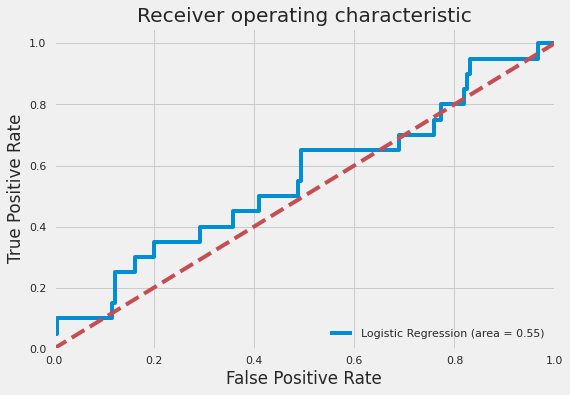

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 2], [0, 2],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

####Severity or cost of the Likelyhood 

In [ ]:
dt.SettlementAmount.unique()

array([0.0, '', 6000000.0, 9000000.0, 6750000.0, 1500000.0, 5750000.0,
       47500000.0, 11250000.0, 2700000.0, 2200000.0, 11000000.0,
       3750000.0], dtype=object)

In [ ]:
dt['SettlementAmount']=dt['SettlementAmount'].replace(np.nan,'')

In [ ]:
dt.head(64)

,gvkey,ggroup,tic,gsector,gind,gsubind,state,sic,dvpsx_f,seq,teq,txt,wcap,xsga,cshtr_c,dvpsp_c,dvpsx_c,prch_c,dvpsp_f,mkvalt,prcc_f,prch_f,prcl_f,sale,reuna,ppent,pi,at,capx,cogs,cshfd,cshpri,dltt,epsfi,epsfx,epspi,epspx,ibmii,mii,ni,nopi,stko,trfm,trt1m,prcc_diff,cshoc,splticrm,Sued,SettlementAmount
0,1239,3030.0,ACV,30.0,303020.0,30302010.0,IL,2844,-0.440271,-0.262800,-0.263883,-0.261244,-0.083417,-0.227938,-0.313801,-0.440267,-0.443560,-0.167853,-0.437248,-0.248570,-0.150281,-0.166386,-0.157658,-0.232644,-0.241274,-0.210049,-0.266824,-0.308599,-0.253233,-0.218193,-0.356721,-0.363411,-0.326493,-0.080255,-0.079841,-0.080439,-0.080000,-0.266195,-0.172712,-0.258987,-0.222099,-0.656926,6.531721e-03,-1.245310e-01,-1.253795e-01,-2.027304e-01,0.152314,1,0.0
1,1266,3020.0,ALCO,30.0,302020.0,30202010.0,FL,100,-0.287467,-0.287721,-0.287972,-0.273806,-0.160988,-0.249146,-0.439075,-0.332229,-0.299554,0.022523,-0.308338,-0.280678,0.003252,0.013898,0.005961,-0.241595,-0.256284,-0.201986,-0.281627,-0.322383,-0.245929,-0.222786,-0.385204,-0.391733,-0.323987,-0.057159,-0.056693,-0.057394,-0.056903,-0.281732,-0.172712,-0.273740,-0.187650,-0.656926,-5.160469e-02,-1.210713e-01,-6.457931e-02,-2.921853e-01,0.152314,0,
2,1408,3020.0,BEAM,30.0,302010.0,30201020.0,IL,2085,0.431610,0.274403,0.255853,-0.161896,1.350208,-0.089676,0.020512,0.430039,0.426473,0.234037,0.435146,0.135933,0.251163,0.235553,0.267351,-0.140607,0.541701,-0.101193,-0.112868,0.126305,-0.084600,-0.161885,-0.139674,-0.144776,0.182813,-0.018767,-0.042989,-0.018079,-0.042789,-0.092201,-0.156421,0.006029,-0.174890,-0.656926,4.865876e+00,-1.137185e-01,1.142007e+00,-2.073847e-01,0.152314,0,
3,1429,3020.0,2388B,30.0,302020.0,30202030.0,MN,2060,-0.539144,-0.264322,-0.260381,-0.278600,-0.140303,-0.208350,0.053384,-0.542303,-0.545564,0.028222,-0.536179,0.034778,0.026946,0.028039,0.026595,-0.200858,0.032314,-0.156456,-0.267927,-0.288538,-0.194438,-0.182208,0.047602,0.048412,-0.306231,0.010591,0.010543,0.010612,0.010538,-0.260834,-0.124537,-0.257237,-0.221763,1.837005,4.666851e-16,8.134663e-17,-2.370852e-17,-5.789052e-17,0.152314,0,
4,1659,3010.0,ANDE,30.0,301010.0,30101020.0,OH,5150,0.096041,-0.234826,-0.234897,-0.216639,0.041098,-0.214976,-0.369570,0.069913,0.090460,0.189465,0.075396,-0.245963,0.194698,0.190976,0.122082,-0.103054,-0.215104,-0.158690,-0.236019,-0.234979,-0.141349,-0.047950,-0.366933,-0.373319,-0.263472,0.001917,0.002382,0.002297,0.002788,-0.241200,-0.165362,-0.235814,-0.011031,-0.656926,-2.081437e-01,-1.089518e-01,-1.978624e-02,-2.804795e-01,0.152314,0,
5,1722,3020.0,ADM,30.0,302020.0,30202010.0,IL,2070,0.251841,1.817734,1.755434,0.727768,9.539564,-0.014926,2.086440,0.273984,0.270467,0.031747,0.255271,0.658715,0.030169,0.031405,0.039780,2.168606,1.272600,0.962993,0.663040,1.616267,1.039543,2.877822,0.665759,0.674394,1.121123,-0.036988,-0.036522,-0.037069,-0.036579,0.630279,-0.168833,0.590690,2.511607,-0.656926,3.234282e-02,-1.206080e-01,-9.436214e-02,1.920978e-01,1.256592,0,
6,1728,3010.0,ARDNA,30.0,301010.0,30101030.0,CA,5411,6.352012,-0.295535,-0.295524,-0.270560,-0.161795,-0.235399,-0.444541,6.360126,6.354697,0.365008,6.359031,-0.281042,0.294377,0.366541,0.377606,-0.234995,-0.262851,-0.214171,-0.279745,-0.327279,-0.256506,-0.217705,-0.393345,-0.400021,-0.334402,0.000942,0.001407,0.000604,0.001094,-0.280410,-0.172712,-0.272487,-0.221926,-0.656926,-1.282946e-01,-1.199620e-01,3.184972e-02,-2.963084e-01,0.152314,0,
7,1920,3030.0,AVP,30.0,303020.0,30302010.0,NY,2844,0.296783,-0.137554,-0.140975,0.065946,0.784763,0.602560,1.962401,0.294992,0.291468,-0.028672,0.300240,0.086200,-0.070261,-0.027188,-0.041900,0.077113,0.291187,-0.027649,-0.079115,0.029488,-0.003464,-0.069354,0.302329,0.308315,0.206307,-0.076252,-0.075222,-0.076539,-0.075483,-0.135859,-0.139160,-0.143724,-0.272216,-0.656926,1.174796e+00,-1.347891e-01,-1.046505e-01,1.196223e-01,0.152314,1,0.0
8,1932,3020.0,BTI,30.0,302030.0,30203010.0,,2111,4.350580,1.179574,1.187618,3.070241,1.014168,0.030004,-0.334081,4.355420,4.35

In [ ]:
dt.shape

(348, 49)

In [ ]:
impact = dt[["gvkey","tic","SettlementAmount"]]

In [ ]:
impact.head(380)

,gvkey,tic,SettlementAmount
0,1239,ACV,0.0
1,1266,ALCO,
2,1408,BEAM,
3,1429,2388B,
4,1659,ANDE,
5,1722,ADM,
6,1728,ARDNA,
7,1920,AVP,0.0
8,1932,BTI,
9,2390,BRID,


In [ ]:
import numpy as np
import scipy.stats as st

#define sample data
data = [ 6000000.0, 9000000.0, 6750000.0, 1500000.0, 5750000.0,11250000.0, 2700000.0, 2200000.0, 11000000.0,3750000.0]

#create 95% confidence interval for population mean weight
st.t.interval(alpha=0.95, df=len(data)-1, loc=np.mean(data), scale=st.sem(data)) 



(3457135.897490499, 8522864.1025095)

In [ ]:
 6000000.0, 9000000.0, 6750000.0, 1500000.0, 5750000.0,
  11250000.0, 2700000.0, 2200000.0, 11000000.0,
       3750000.0